# Monet's Paintings using DCGAN

In this problem, we will generate Monet paintings using DCGAN. 

DCGAN, or Deep Convolutional Generative Adversarial Network, is a variant of the Generative Adversarial Network (GAN) framework specifically designed to use deep convolutional neural networks. Developed by Alec Radford, Luke Metz, and Soumith Chintala in 2015, DCGAN represents a pivotal moment in the field of deep learning by effectively combining Convolutional Neural Networks (CNNs) with GANs. Here’s a detailed breakdown of DCGAN:

**Basic Concepts**

**Generative Adversarial Networks (GANs)**

GANs consist of two neural networks—the generator and the discriminator—trained simultaneously in a game-theoretic scenario. The generator creates synthetic data samples (e.g., images), trying to fool the discriminator. The discriminator, on the other hand, attempts to distinguish between real samples (drawn from the training data) and fake samples (produced by the generator). The training process involves optimizing both networks until the discriminator can no longer differentiate real from fake, implying that the generator has learned to produce highly realistic samples.

**Convolutional Neural Networks (CNNs)**

CNNs are deep learning architectures typically used in analyzing visual imagery. They use a mathematical operation called convolution over the input layer which preserves the relationship between pixels by learning image features using small squares of input data. CNNs are highly effective in image recognition tasks, which makes them ideal for tasks involving images in GANs.

**DCGAN Architecture**

The DCGAN framework introduces several key architectural guidelines for both the generator and the discriminator, which primarily involve leveraging convolutional layers. These guidelines include:

Replacing any pooling layers with strided convolutions (discriminator) and fractional-strided convolutions (generator): This modification allows the network to learn its own spatial downsampling (in the discriminator) and upsampling (in the generator), which helps in learning more complex patterns efficiently.

Using batch normalization in both the generator and the discriminator: Batch normalization helps in stabilizing the learning process by normalizing the input layer by adjusting and scaling activations. It is used in both networks to prevent the generator from collapsing all samples to a single point which is a common failure mode in GANs.

Eliminating fully connected hidden layers for deeper architectures: This simplifies the network architecture and reduces the risk of overfitting on the training data.

Using ReLU activation in the generator for all layers except for the output, which uses Tanh: ReLU activation helps in accelerating the convergence of the training process, while Tanh is used at the output layer to match the range of the image data (typically normalized between -1 and 1).

Using LeakyReLU activation in the discriminator for all layers: This function allows a small gradient when the unit is not active and helps in maintaining the flow of gradients throughout the learning process.

**Training DCGANs**

Training DCGANs involves alternately updating the discriminator and the generator using batches of data. The discriminator is trained by alternating between real and fake data samples, providing it with the correct labels for both. The generator is updated based on how well it manages to fool the discriminator. The process involves backpropagating the gradients and updating the weights with the help of an optimizer (usually Adam).

**Applications of DCGANs**

DCGANs have been pivotal in the field of generative models, particularly in improving the quality of generated images. Their applications include:

Image synthesis and photo editing

Super-resolution

Semantic image editing

Generating art

Moreover, the architecture of DCGANs has inspired numerous innovations in the design of generative models, influencing other advanced models in generating realistic images, videos, and even music.

DCGANs marked a significant advancement in the ability to train deeper, more stable Generative Adversarial Networks using convolutional architectures, setting the stage for further explorations into both the theory and application of GANs in various domains.

# Data Description

The dataset contains four directories: monet_tfrec, photo_tfrec, monet_jpg, and photo_jpg. The monet_tfrec and monet_jpg directories contain the same painting images, and the photo_tfrec and photo_jpg directories contain the same photos.

The monet directories contain Monet paintings. We are using these paintings to train these models.

Files
monet_jpg - 300 Monet paintings sized 256x256 in JPEG format

monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format

photo_jpg - 7028 photos sized 256x256 in JPEG format

photo_tfrec - 7028 photos sized 256x256 in TFRecord format

In [1]:
!pip install imageio

In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
import zipfile
import pandas as pd
import tensorflow.keras as keras
import numpy as np
import matplotlib.pyplot as plt
import PIL
import re
import imageio
from PIL import Image
import shutil
import glob
import time
import matplotlib.animation as animation
from IPython.display import HTML
import glob
from kaggle_datasets import KaggleDatasets
from IPython import display

from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras.utils import plot_model
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Flatten, Reshape
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.layers import ReLU, LeakyReLU, Activation
from tensorflow.keras.optimizers import Adam
from PIL import Image
import shutil

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
except Exception as e:
    print("can't initialize tpu, using default, exception: " + str(e))
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE

can't initialize tpu, using default, exception: Please provide a TPU Name to connect to.
Number of replicas: 1


---
# Create subdirectories GANs
This section  involves setting up directories where output from GANs (Generative Adversarial Networks) will be stored. This includes directories for saving model checkpoints and generated images.



In [3]:
for i in range(5):
    os.makedirs(os.path.join('/kaggle/working/', 'grid_' + str(i+1)))
    os.makedirs(os.path.join('/kaggle/working/', 'single_' + str(i+1)))

---
# Exploratory data analysis
This section is crucial as it involves analyzing the dataset that will be used to train the GAN. The exploratory data analysis (EDA)  includes visualizing the data, understanding its distribution, shape, and form, which in this case would be images of Monet's paintings.

In [4]:
GCS_PATH = KaggleDatasets().get_gcs_path('monet-tfrecords-256x256')
MONET_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/monet*.tfrec'))

def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

count_data_items(MONET_FILENAMES)

1367

In [5]:
# return the image from the TFRecord
image_size = [256, 256]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*image_size, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        'image':      tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

In [6]:
# define the function to extract the image from the files
def load_data(filenames, labeled=True, ordered=False):
    data = tf.data.TFRecordDataset(filenames)
    data = data.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return data

In [7]:
monet = load_data(MONET_FILENAMES).batch(32)
sample_monet = next(iter(monet))

In [8]:
sample_monet.shape

TensorShape([32, 256, 256, 3])

In [9]:
# define visualization function to view image
def visualize_images(example):
    plt.figure(figsize = (10, 10))
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(example[i] * 0.5 + 0.5)
        plt.axis("off")

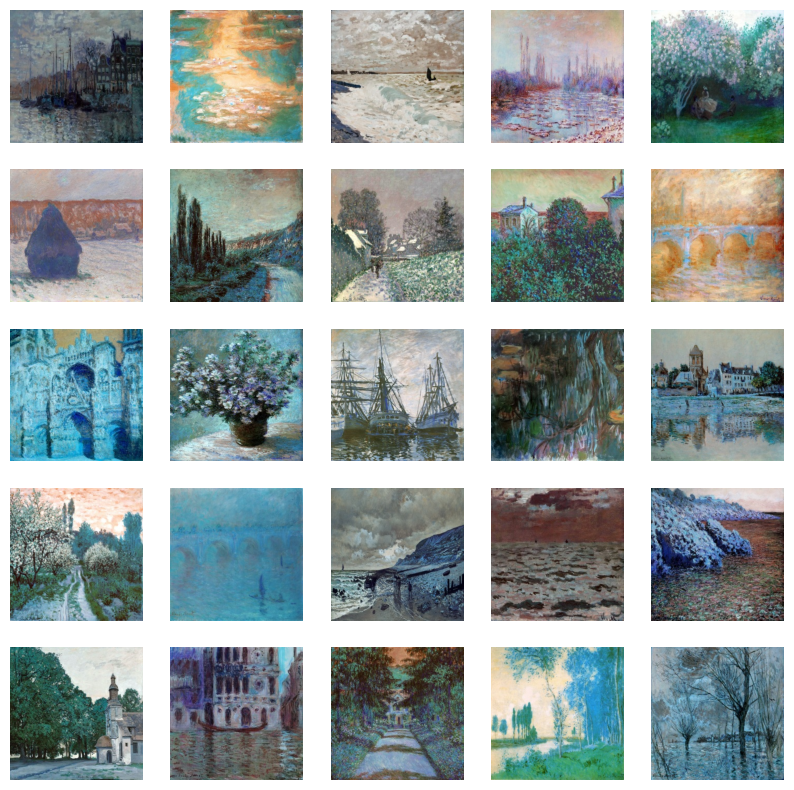

In [10]:
visualize_images(sample_monet)

---
# Functions

Here, various functions required for the GAN's operation are defined. This  includes functions to load data, preprocess images, display images, and  some utility functions like saving checkpoints or plotting losses.

In [11]:
def zip_images(directory, zip_file_name):    
    # Create a list of all the image files in the directory
    image_files = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')]
    
    # Create a new zip file
    with zipfile.ZipFile(zip_file_name, 'w') as zip_file:
        # Add each image file to the zip file
        for image_file in image_files:
            zip_file.write(image_file, os.path.basename(image_file))

In [12]:
# Display a single image using the epoch number
def display_image(directory, epoch_no):
    return PIL.Image.open(os.path.join(directory, 'image_at_epoch_{:04d}.png'.format(epoch_no)))

In [13]:
def save_batch(directory, batch_predictions):
    for i, image in enumerate(batch_predictions):
    # Create a new figure and axis for each image
        fig, ax = plt.subplots()
        # Display the image on the axis
        ax.imshow(batch_predictions[i, :, :, :])
        plt.axis('off')
        plt.savefig(os.path.join(directory, f'image_{i}.png'), bbox_inches='tight', pad_inches=0)
        # Close the figure to free up memory
        plt.close(fig)

In [14]:
def save_single_image(directory, first_image, epoch):
    image = 0.5 * first_image + 0.5
    plt.imsave(os.path.join(directory, f"image_at{epoch}.png"), image)

In [15]:
def tf_gif(directory, anim_file):
    with imageio.get_writer(anim_file, mode='I') as writer:
        filenames = glob.glob(os.path.join('/kaggle/working/', directory, 'image*.png'))
        filenames = sorted(filenames)

        for i in range(len(filenames)):
            filename = filenames[i]
            image = imageio.imread(filename)
            
            # Filter to reduce size of gif
            if i < 200:
                if i % 3 == 0:
                    writer.append_data(image)
            else:
                if i % 2 == 0:
                    writer.append_data(image)

In [16]:
def embed_gif(directory):
    fig = plt.figure(figsize=(8, 8))
    fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)
    plt.axis("off")

    imgs_gif = []
    for file_name in sorted(glob.glob(os.path.join('/kaggle/working/', directory, 'image*.png'))):
        #epoch_imgs = plt.imshow(plt.imread(file_name), animated=True)
        imgs_gif.append([plt.imshow(plt.imread(file_name), animated=True)])

    return animation.ArtistAnimation(fig, imgs_gif, interval=250, repeat_delay=250, blit=True)

In [17]:
def plot_loss_training(epochs, mean_loss, title):
    plt.plot(epochs, mean_loss, label='Average loss per epoch', linestyle='--', color='red')
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel('Loss', fontsize=12)
    plt.title('Average Loss per Epoch', fontsize=14)
    plt.grid()
    plt.xlim(0, max(epochs)+1)
    plt.ylim(0, max(mean_loss)+0.5)
    plt.legend()
    plt.savefig(title)
    plt.show()

# **Model architecture**

**Generator**

Following function defines the architecture of the Generator model in a Deep Convolutional Generative Adversarial Network (DCGAN).The purpose of the Generator is to synthesize new images from random noise. It is designed to ultimately produce 256x256 pixel images that mimic the complexity and style of Monet's paintings, based on the layer setups.

Model Initialization: A new sequential model is created named "Generator".

Hidden Layer 1: Start with 16 x 16 image

Dense Layer: This dense layer is the first layer of the network which receives a 100-dimensional noise vector as input. It outputs n_nodes which are computed as 16*16*512. This means the layer will have 131072 output nodes.

Reshape: The output of the dense layer, which is a flat vector, is reshaped into a 16x16x512 tensor. This step is preparing the output to be processed by convolutional layers as if it is a 16x16 image with 512 channels (deep feature map).

Hidden Layer 2: Upsample to 32 x 32

Conv2DTranspose (also known as Deconvolution): This layer increases the spatial dimensions of its input. Here it upsamples the 16x16x512 input to 32x32x256. 

The parameters:
filters=256 specifies the number of output channels.

kernel_size=(3, 3) is the size of the kernel used in transposed convolution.

strides=(2, 2) indicates the factor by which image dimensions are upscaled.

padding='same' ensures the output has the same dimension as the input spatially when the stride is 1 (i.e., it pads the input as necessary).

LeakyReLU: This activation function allows a small, positive gradient (slope=0.2) when the unit is not active and outputting zero. This helps keep information flowing through the network even when the input is negative.

Hidden Layer 3: Upsample to 64 x 64

Similar to the previous Conv2DTranspose, this layer further upsamples from 32x32x256 to 64x64x128.

Hidden Layer 4: Upsample to 128 x 128

Hidden Layer 5: Upsample to 256 x 256

Output Layer:

Final Conv2DTranspose: This is the output layer of the generator. It uses a tanh activation function, typical for GANs because it centers the image pixel values between -1 and 1. This layer does not change the dimensionality (256x256x32 to 256x256x3), but it reduces the depth to 3, corresponding to the RGB channels of a color image.



In [18]:
def create_generator():
    model = Sequential(name="Generator")
    
    # Base number of nodes which is multiplied at each layer's node calculation
    base_nodes = 16 * 16  # corresponds to the initial image size (16x16)

    # Input Layer: Takes a fixed-length seed (100 dimensions)
    model.add(Dense(base_nodes * 512, input_shape=(100,), use_bias=False, name='input_layer'))
    model.add(Reshape((16, 16, 512), name='reshape_layer_to_16x16'))
    
    # Hidden Layer 1: Upsample to 32x32
    model.add(Conv2DTranspose(256, kernel_size=3, strides=2, padding='same', use_bias=False, name='hidden_layer_1'))
    model.add(LeakyReLU(alpha=0.2, name='leaky_relu_1'))
        
    # Hidden Layer 2: Upsample to 64x64
    model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same', use_bias=False, name='hidden_layer_2'))
    model.add(LeakyReLU(alpha=0.2, name='leaky_relu_2'))
        
    # Hidden Layer 3: Upsample to 128x128
    model.add(Conv2DTranspose(64, kernel_size=3, strides=2, padding='same', use_bias=False, name='hidden_layer_3'))
    model.add(LeakyReLU(alpha=0.2, name='leaky_relu_3'))
        
    # Hidden Layer 4: Upsample to 256x256
    model.add(Conv2DTranspose(32, kernel_size=3, strides=2, padding='same', use_bias=False, name='hidden_layer_4'))
    model.add(LeakyReLU(alpha=0.2, name='leaky_relu_4'))
        
    # Output Layer: Generate a 256x256 3-channel color image
    model.add(Conv2DTranspose(3, kernel_size=3, activation='tanh', strides=1, padding='same', use_bias=False, name='output_layer'))
  
    return model

In [19]:
# Use the noise vector to create an image. The generator is still untrained here!
with strategy.scope():
    generator = create_generator()

# Show model summary
generator.summary()

Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Dense)         (None, 131072)            13107200  
                                                                 
 reshape_layer_to_16x16 (Res  (None, 16, 16, 512)      0         
 hape)                                                           
                                                                 
 hidden_layer_1 (Conv2DTrans  (None, 32, 32, 256)      1179648   
 pose)                                                           
                                                                 
 leaky_relu_1 (LeakyReLU)    (None, 32, 32, 256)       0         
                                                                 
 hidden_layer_2 (Conv2DTrans  (None, 64, 64, 128)      294912    
 pose)                                                           
                                                         

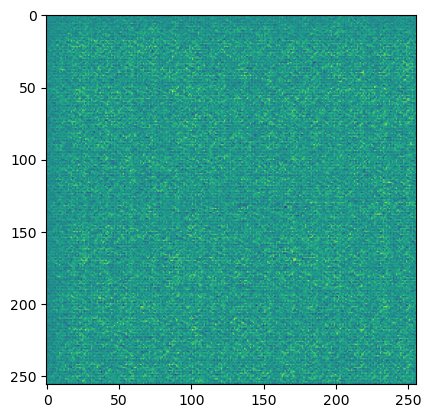

In [20]:
# create vector of random noise to pass through the generator to see what the output is without the network having been trained
noise = tf.random.normal([1, 100])
with strategy.scope():
    generated_image = generator(noise, training=False)

plt.imshow(generated_image[0,:,:,0])

---
# Discriminator

Model Initialization: Initializes a sequential model named "Discriminator". This model will stack layers in the order they are added.

Hidden Layer 1:

Conv2D: This convolutional layer starts processing the input image (256x256 pixels with 3 color channels). It uses 32 filters with a 3x3 kernel, striding down by a factor of 2. The 'same' padding ensures the output height and width remain the same as the input when the stride is 1.

LeakyReLU: Adds a small slope of 0.2 to keep the network active even when negative values are produced, preventing the dying ReLU problem.

Hidden Layers 2-5:

These layers progressively increase the number of filters while reducing the spatial dimensions of the input, increasing the depth of feature maps which helps in capturing complex patterns.

Conv2D: Increases the number of filters to 64, continuing to reduce the dimensionality of the image.

BatchNormalization: Normalizes the output of the previous layer, reducing internal covariate shift which helps in faster training and higher overall accuracy.

LeakyReLU: Activation function as before.

The pattern repeats with increasing filters at each subsequent layer (128, 256, 512), each time halving the spatial dimensions of the feature maps, enhancing the network's ability to abstract and encode high-level features at each layer.

Flatten and Output Layers:

Flatten: Converts the 3D feature maps to 1D feature vectors, preparing them for the final classification.

Dropout: Randomly drops 30% of the connections (setting them to zero) during training, which helps in preventing overfitting.

Dense: The final output layer with one neuron and a sigmoid activation function that outputs a probability indicating how likely the input image is real (as opposed to fake).

The Discriminator is a deep convolutional neural network that functions as a binary classifier within the GAN architecture. Its role is to learn to distinguish real images from fake ones produced by the Generator. The architecture is designed to progressively abstract higher-level features using deeper convolutional layers, normalize layer inputs for stability with batch normalization, maintain gradient flow with LeakyReLU activations, and mitigate overfitting with dropout before making a classification decision. This setup is typical for discriminators in GANs dealing with image data.

In [21]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, LeakyReLU, BatchNormalization, Flatten, Dropout, Dense

def create_discriminator():
    model = Sequential(name="Discriminator")

    # Hidden Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2, 2), padding='same', input_shape=[256, 256, 3], name='hidden_layer_1'))
    model.add(LeakyReLU(0.2, name='activation_1'))

    # Hidden Layer 2
    model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same', name='hidden_layer_2'))
    model.add(BatchNormalization(name='batch_norm_1'))
    model.add(LeakyReLU(0.2, name='activation_2'))

    # Hidden Layer 3
    model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same', name='hidden_layer_3'))
    model.add(BatchNormalization(name='batch_norm_2'))
    model.add(LeakyReLU(0.2, name='activation_3'))

    # Hidden Layer 4
    model.add(Conv2D(256, (3, 3), strides=(2, 2), padding='same', name='hidden_layer_4'))
    model.add(BatchNormalization(name='batch_norm_3'))
    model.add(LeakyReLU(0.2, name='activation_4'))

    # Hidden Layer 5
    model.add(Conv2D(512, (3, 3), strides=(2, 2), padding='same', name='hidden_layer_5'))
    model.add(BatchNormalization(name='batch_norm_4'))
    model.add(LeakyReLU(0.2, name='activation_5'))

    # Flatten and Output Layers
    model.add(Flatten(name='flatten'))
    model.add(Dropout(0.3, name='dropout'))
    model.add(Dense(1, activation='sigmoid', name='output_layer'))

    return model


In [22]:
# Use the noise vector to create an image. The generator is still untrained here!
with strategy.scope():
    discriminator = create_discriminator()

# Show model summary 
discriminator.summary()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hidden_layer_1 (Conv2D)     (None, 128, 128, 32)      896       
                                                                 
 activation_1 (LeakyReLU)    (None, 128, 128, 32)      0         
                                                                 
 hidden_layer_2 (Conv2D)     (None, 64, 64, 64)        18496     
                                                                 
 batch_norm_1 (BatchNormaliz  (None, 64, 64, 64)       256       
 ation)                                                          
                                                                 
 activation_2 (LeakyReLU)    (None, 64, 64, 64)        0         
                                                                 
 hidden_layer_3 (Conv2D)     (None, 32, 32, 128)       73856     
                                                     

**Generate loss function and discriminator loss function**

The generator's goal is to fool the discriminator by generating images that are as close as possible to real images. Hence, its loss measures how well it tricks the discriminator into believing that fake outputs are real.

The discriminator's job is to distinguish between real and fake images correctly.

These functions use the Binary Cross-Entropy loss to measure how well the Generator and Discriminator are performing.

In [23]:
def generator_loss(fake_output):
    """Computes the generator loss for GANs.
    
    Parameters:
    - fake_output: The discriminator's output on the generator's fake images.
    
    Returns:
    - Loss tensor of type float.
    """
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # We use tf.ones_like to label all fake outputs as real (1) to fool the discriminator
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    """Computes the discriminator loss for GANs.
    
    Parameters:
    - real_output: The discriminator's output on real images.
    - fake_output: The discriminator's output on fake images.
    
    Returns:
    - Total loss tensor of type float.
    """
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)  # Real images should be predicted as real
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)  # Fake images should be predicted as fake
    total_loss = real_loss + fake_loss
    return total_loss


In [24]:
# Create two separate optimizers for the generator and discriminator
with strategy.scope():
    generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
    discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

**Setting Hyperparameters**

First, we define constants that will control the training process:

# First Model

In [25]:
EPOCHS = 50           # Total number of epochs to train
BATCH_SIZE = 32          # Number of samples in each batch
noise_dim = 100          # Dimensionality of the input noise vector for the generator
shape_dim = [256, 256, 3]# Shape of the input images for the discriminator
examples_to_generate = 25 # Number of examples to generate for visualization
seed = tf.random.normal([examples_to_generate, noise_dim]) # Seed input for generator to visualize progression

In [26]:
class DCGAN_model:
    def __init__(self, noise_dim, seed, EPOCHS, BATCH_SIZE, 
                 generator, discriminator, dataset, num_model):  
        self.noise_dim = noise_dim
        self.EPOCHS = EPOCHS
        self.BATCH_SIZE = BATCH_SIZE
        
        self.generator = generator
        #self.discriminator = discriminator2
        self.dataset = dataset
        self.num = num_model
        self.seed = seed
    
    @tf.function
    def train(self, images):
    
    # Create random noise vector
        noise = tf.random.normal([images.shape[0], noise_dim])

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        # generate images use random noise vector
            generated_images = self.generator(noise, training=True)

            # use discriminator to evaluate the real and fake images
            real_output = discriminator(images, training=True)
            fake_output = discriminator(generated_images, training=True)

            # compute generator loss and discriminator loss
            gen_loss = generator_loss(fake_output)
            disc_loss = discriminator_loss(real_output, fake_output)

            # Compute gradients
            gradients_of_generator = gen_tape.gradient(gen_loss, self.generator.trainable_variables)
            gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

            # Update optimizers
            generator_optimizer.apply_gradients(zip(gradients_of_generator, self.generator.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
        
        return (gen_loss + disc_loss) * 0.5
    
    @tf.function
    def distributed_train(self, images):
        per_replica_losses = strategy.run(self.train, args=(images,))
        return strategy.reduce(tf.distribute.ReduceOp.MEAN, per_replica_losses, axis=None)
    
    def generate_images(self):
        predictions = self.generator.predict(self.seed)
        return predictions
        
    def save_images(self, directory, epoch, images):
        gen_imgs = 0.5 * images + 0.5

        fig = plt.figure(figsize=(5, 5))

        for i in range(25):
            plt.subplot(5, 5, i+1)
            plt.imshow(gen_imgs[i, :, :, :])
            plt.axis('off')

        plt.savefig(os.path.join(directory, 'image_at_epoch_{:04d}.png'.format(epoch)))
        plt.close()
            
    def plot_images(self, images):      
        gen_imgs = 0.5 * images + 0.5
        
        fig = plt.figure(figsize=(10, 10))
        for i in range(25):
            plt.subplot(5, 5, i+1)
            plt.imshow(gen_imgs[i, :, :, :])
            plt.axis('off')
        plt.show()

    def train_loop(self):
        e_ls = []
        mean_ls = []
        
        for epoch in range(self.EPOCHS):
            start = time.time()

            total_loss = 0.0
            num_batches = 0

            for image_batch in self.dataset:
                loss = self.distributed_train(image_batch)
                total_loss += tf.reduce_mean(loss)  # Compute the mean loss accross the tensors
                num_batches += 1
            
            mean_loss = total_loss / num_batches
            
            mean_ls.append(mean_loss)
            e_ls.append(epoch+1)
            
            images = self.generate_images()
            self.save_images('grid_' + self.num, epoch+1, images)
            save_single_image('single_' + self.num, images[0], epoch+1)

            if (epoch+1) % 20 == 0:                                  
                print ('Time for epoch {} is {} sec, mean loss is {}'.format(epoch + 1, time.time()-start, mean_loss))
                self.plot_images(images)
       
        table = pd.DataFrame({"Epoch": e_ls, "Mean Loss": np.array(mean_ls)})
        
        return table, e_ls, mean_ls

Explanation of Key Components

__init__ Method:
Initializes the model with the generator, discriminator, dataset, and a model number for naming files.
Sets up essential parameters and a seed used for generating images for visual progress checks.

train_step Method:
Noise Vector Generation: Creates a batch of random noise vectors.
Image Generation & Discrimination: Passes noise through the generator to create fake images, and then both real and generated images through the discriminator.

Loss Calculation: Computes separate losses for the discriminator and generator.

Gradient Calculation & Application: Calculates gradients of losses with respect to the models' parameters and updates the models using the optimizers.
train Method:

Orchestrates the training process over all epochs, periodically printing the progress and saving generated images.

generate_and_save_images Method:
Generates and saves images at specified epochs to track the visual progress of the generator's training.

In [27]:

gan1 = DCGAN_model(noise_dim, seed, EPOCHS, BATCH_SIZE, generator, discriminator, monet, '1')

/opt/conda/lib/python3.7/site-packages/keras/backend.py:5677: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits, "Sigmoid", "binary_crossentropy"


1/1 [==============================] - 0s 140ms/step
Time for epoch 20 is 12.192283391952515 sec, mean loss is 2.49007248878479


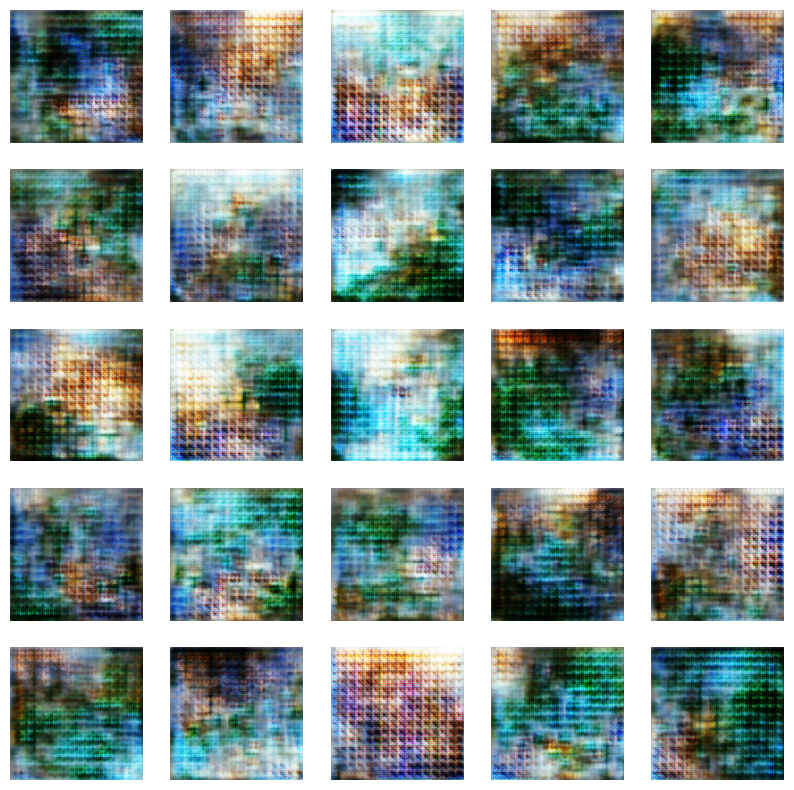

1/1 [==============================] - 0s 141ms/step
Time for epoch 40 is 12.014829397201538 sec, mean loss is 1.509078860282898


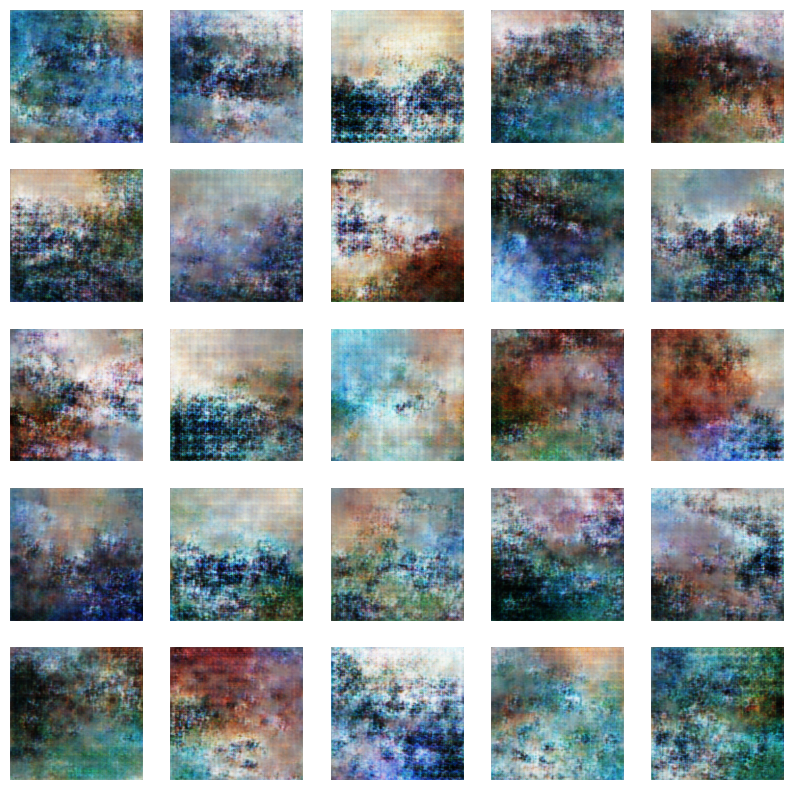

1/1 [==============================] - 0s 135ms/step


In [28]:
table, ep_ls, mean_ls = gan1.train_loop()

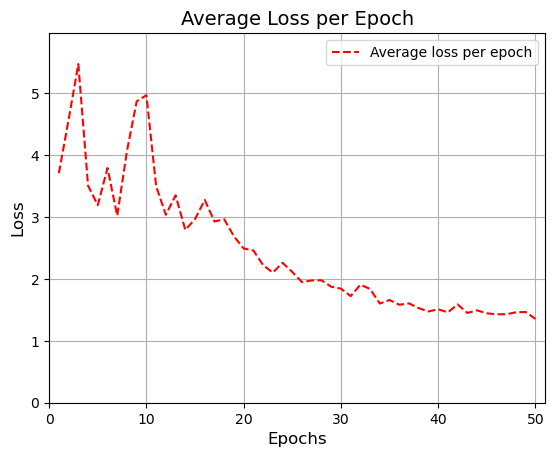

In [29]:
# Plot the losses
plot_loss_training(ep_ls, mean_ls, 'avg_loss_per_epoch')

In [30]:
tf_gif('single_1', 'single_1.gif')
tf_gif('grid_1', "dcgan_1.gif")

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  


In [31]:
for folder in ['single', 'grid']:
    zip_images('/kaggle/working/' + folder + '_1', 'dcgan_' + folder + '_1.zip')

# **Second DCGAN Model with different learning rate**

Same architecture as DCGAN 1 but with different hyperparameters in Adam optimizer

We will update the learning rate from 0.0002 to 0.0004

In [32]:
with strategy.scope():
    generator = create_generator()
    discriminator = create_discriminator()
    
    def generator_loss(fake_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)
        return cross_entropy(tf.ones_like(fake_output), fake_output)

    # create loss function for the discriminator
    def discriminator_loss(real_output, fake_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        total_loss = real_loss + fake_loss
        return total_loss
    
    generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0004, beta_1=0.5)
    discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0004, beta_1=0.5)

In [33]:
gan2 = DCGAN_model(noise_dim, seed, 50, BATCH_SIZE, generator, discriminator, monet, '2')

1/1 [==============================] - 0s 139ms/step
Time for epoch 20 is 11.95658016204834 sec, mean loss is 2.0755133628845215


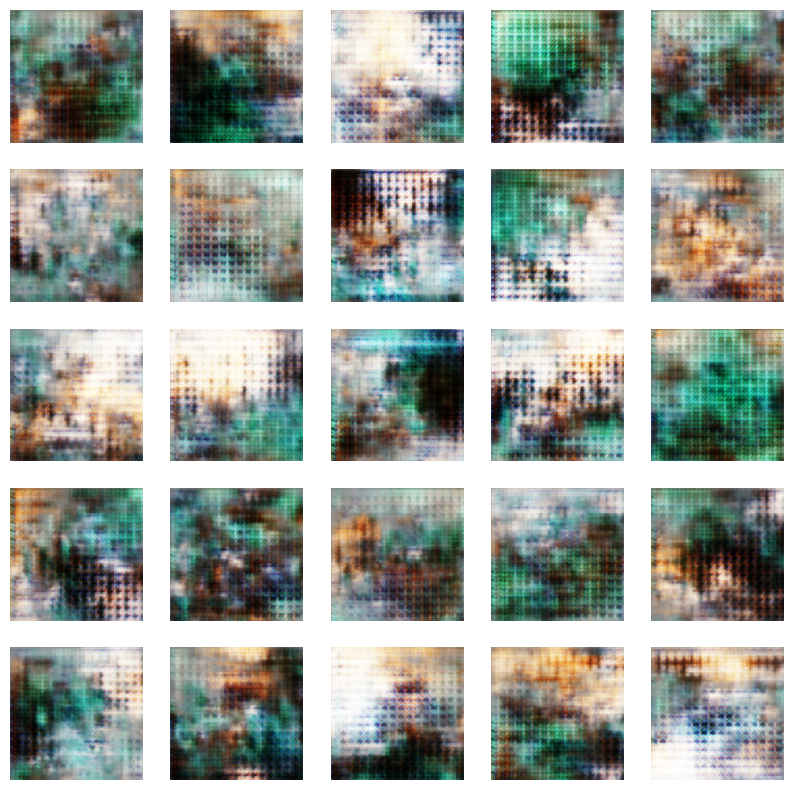

1/1 [==============================] - 0s 141ms/step
Time for epoch 40 is 12.018744468688965 sec, mean loss is 1.6164132356643677


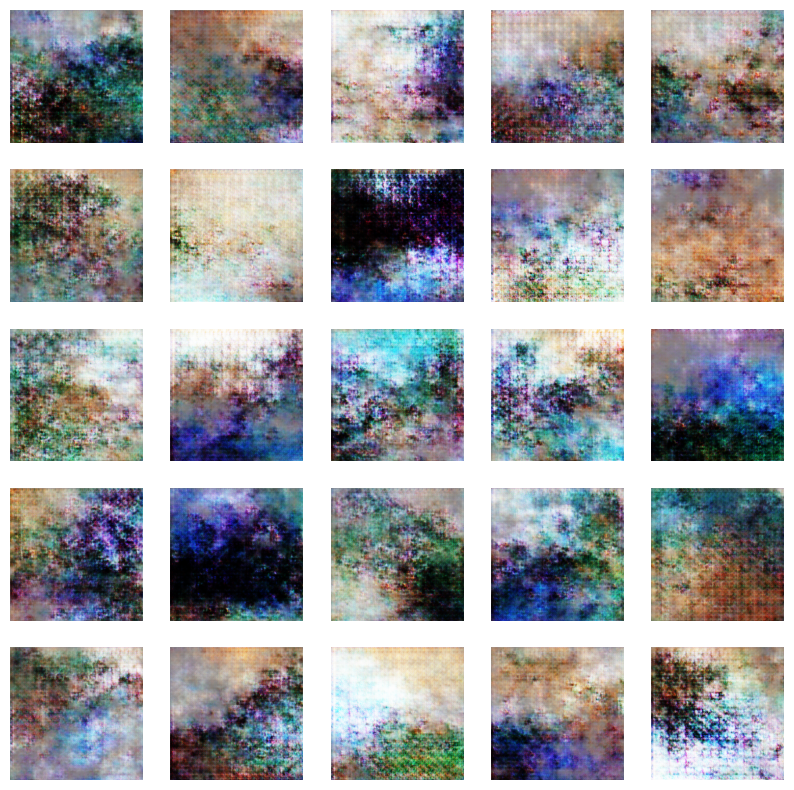

1/1 [==============================] - 0s 141ms/step


In [34]:
table_2, ep_ls_2, mean_ls_2 = gan2.train_loop()

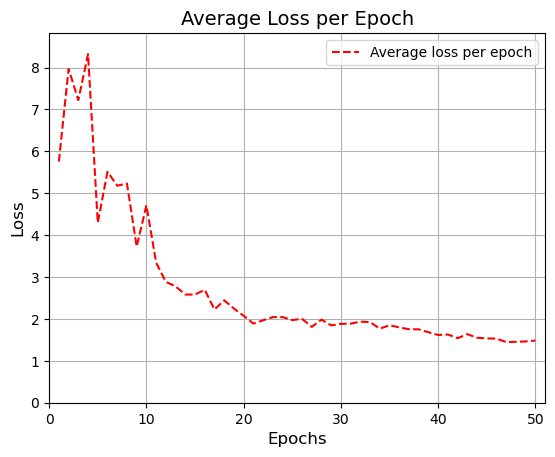

In [35]:
plot_loss_training(ep_ls_2, mean_ls_2, 'avg_loss_per_epoch_2')

In [36]:
tf_gif('single_2', 'single_2.gif')
tf_gif('grid_2', "dcgan_2.gif")

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  


In [37]:
for folder in ['single', 'grid']:
    zip_images('/kaggle/working/' + folder + '_2', 'dcgan_' + folder + '_2.zip')

# **DCGAN 3 Different kernel size 5X5**

Kernel Size:
The use of a 5x5 kernel in all convolutional layers is a bit larger than the more common size. Larger kernels might capture more spatial information and might be beneficial depending on the complexity and variety of the training data.

In [38]:
def create_generator2():
    model = Sequential(name="Generator2")
    
    # Hidden Layer 1: Start with 16 x 16 image
    n_nodes = 16 * 16 * 512 # number of nodes in the first hidden layer
    model.add(Dense(n_nodes, input_shape=(100,), name='Generator-Hidden-Layer-1'))
    model.add(Reshape((16, 16, 512), name='Generator-Hidden-Layer-Reshape-1'))
   
    # Hidden Layer 2: Upsample to 32 x 32
    model.add(Conv2DTranspose(filters=256, kernel_size=(5, 5), strides=(2, 2), padding='same', name='Generator-Hidden-Layer-2'))
    model.add(LeakyReLU(alpha=0.2))
        
    # Hidden Layer 3: Upsample to 64 x 64
    model.add(Conv2DTranspose(filters=128, kernel_size=(5, 5), strides=(2, 2), padding='same', name='Generator-Hidden-Layer-3'))
    model.add(LeakyReLU(alpha=0.2))
        
    # Hidden Layer 4: Upsample to 128 x 128
    model.add(Conv2DTranspose(filters=64, kernel_size=(5, 5), strides=(2, 2), padding='same', name='Generator-Hidden-Layer-4'))
    model.add(LeakyReLU(alpha=0.2))
        
    # Hidden Layer 5: Upsample to 256 x 256
    model.add(Conv2DTranspose(filters=32, kernel_size=(5, 5), strides=(2, 2), padding='same', name='Generator-Hidden-Layer-5'))
    model.add(LeakyReLU(alpha=0.2))
        
    # Output Layer: we use 3 filters because we have 3 channels for a color image.
    model.add(Conv2DTranspose(3, kernel_size=(5, 5), activation='tanh', strides=(1, 1), padding='same', name='Generator-Output-Layer'))
  
    return model

In [39]:
# create a function to build the discriminator model
def create_discriminator2():
    model = Sequential(name="Discriminator2") # Model
    
    # Hidden Layer 1
    model.add(Conv2D(filters=32, kernel_size=(5,5), strides=(2, 2), padding='same', input_shape=[256, 256, 3], name='Discriminator-Hidden-Layer-1'))
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-1'))
    
    # Hidden Layer 2
    model.add(Conv2D(filters=64, kernel_size=(5,5), strides=(2, 2), padding='same', name='Discriminator-Hidden-Layer-2'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-2'))
       
    # Hidden Layer 3
    model.add(Conv2D(filters=128, kernel_size=(5,5), strides=(2, 2), padding='same', name='Discriminator-Hidden-Layer-3'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-3'))
      
    # Hidden Layer 4
    model.add(Conv2D(filters=256, kernel_size=(5,5), strides=(2, 2), padding='same', name='Discriminator-Hidden-Layer-4'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-4'))
  
    # Hidden Layer 5
    model.add(Conv2D(filters=512, kernel_size=(5,5), strides=(2, 2), padding='same', name='Discriminator-Hidden-Layer-5'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-5'))
    
    # Flatten and Output Layers
    model.add(Flatten(name='Discriminator-Flatten-Layer')) # Flatten the shape
    model.add(Dropout(0.3, name='Discriminator-Flatten-Layer-Dropout')) # Randomly drop some connections for better generalization
    model.add(Dense(1, activation='sigmoid', name='Discriminator-Output-Layer')) # Output Layer
    
    return model

In [40]:
with strategy.scope():
    generator2 = create_generator2()
    discriminator2 = create_discriminator2()
    
    def generator_loss(fake_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)
        return cross_entropy(tf.ones_like(fake_output), fake_output)

    # create loss function for the discriminator
    def discriminator_loss(real_output, fake_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        total_loss = real_loss + fake_loss
        return total_loss
    
    generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
    discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

In [41]:
gan4 = DCGAN_model(noise_dim, seed, 50, BATCH_SIZE, generator2, discriminator2, monet, '4')

1/1 [==============================] - 0s 254ms/step
Time for epoch 20 is 17.65193772315979 sec, mean loss is 2.0651791095733643


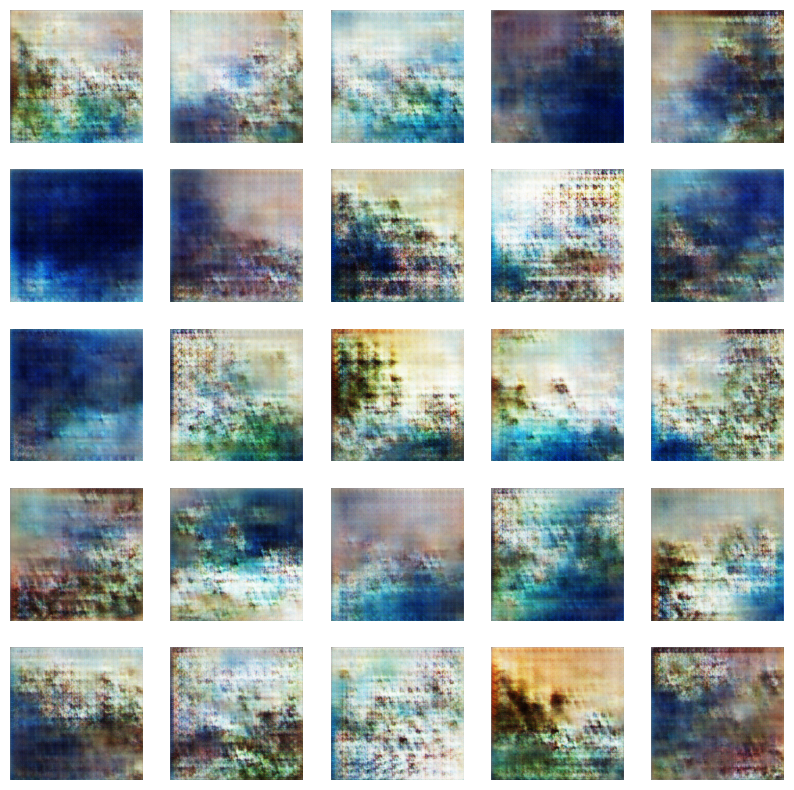

1/1 [==============================] - 0s 265ms/step
Time for epoch 40 is 17.56758952140808 sec, mean loss is 1.4494777917861938


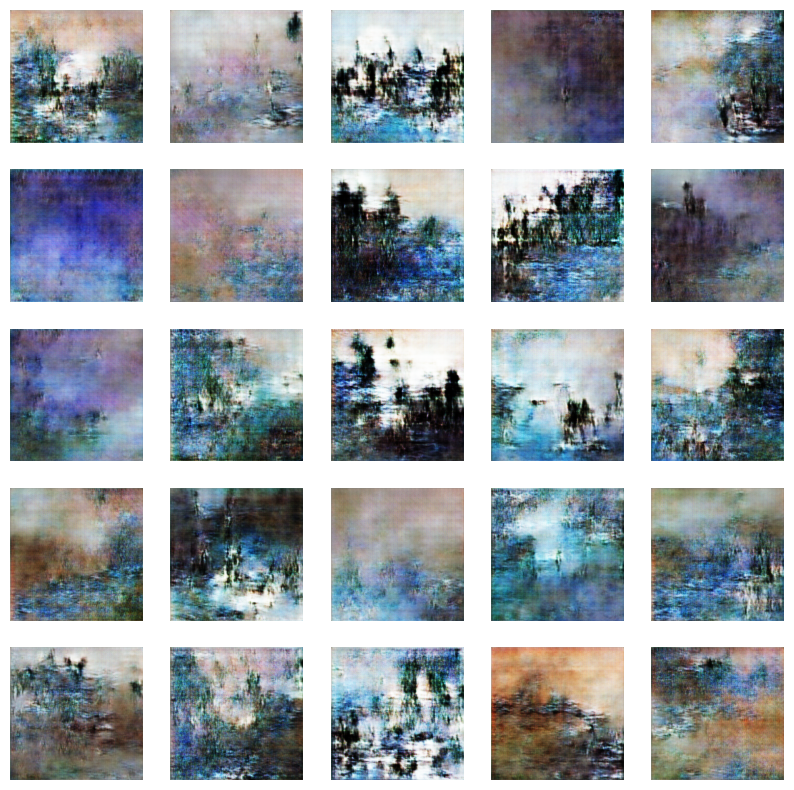

1/1 [==============================] - 0s 253ms/step


In [42]:
table_4, ep_ls_4, mean_ls_4 = gan4.train_loop()

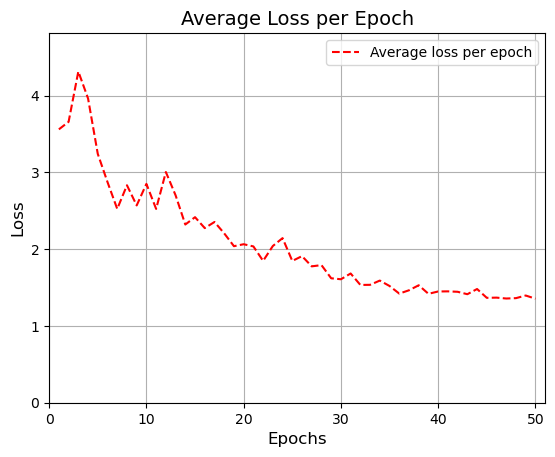

In [43]:
plot_loss_training(ep_ls_4, mean_ls_4, 'avg_loss_per_epoch_4')

In [44]:
tf_gif('single_4', 'single_4.gif')
tf_gif('grid_4', "dcgan_4.gif")

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  


In [45]:
for folder in ['single', 'grid']:
    zip_images('/kaggle/working/' + folder + '_4', 'dcgan_' + folder + '_4.zip')

# **DCGAN 5 Kernel size 4x4**

In [46]:
def create_generator3():
    model = Sequential(name="Generator3")
    
    # Hidden Layer 1: Start with 16 x 16 image
    n_nodes = 16 * 16 * 512 # number of nodes in the first hidden layer
    model.add(Dense(n_nodes, input_shape=(100,), name='Generator-Hidden-Layer-1'))
    model.add(Reshape((16, 16, 512), name='Generator-Hidden-Layer-Reshape-1'))
   
    # Hidden Layer 2: Upsample to 32 x 32
    model.add(Conv2DTranspose(filters=256, kernel_size=(4, 4), strides=(2, 2), padding='same', name='Generator-Hidden-Layer-2'))
    model.add(LeakyReLU(alpha=0.2))
        
    # Hidden Layer 3: Upsample to 64 x 64
    model.add(Conv2DTranspose(filters=128, kernel_size=(4, 4), strides=(2, 2), padding='same', name='Generator-Hidden-Layer-3'))
    model.add(LeakyReLU(alpha=0.2))
        
    # Hidden Layer 4: Upsample to 128 x 128
    model.add(Conv2DTranspose(filters=64, kernel_size=(4, 4), strides=(2, 2), padding='same', name='Generator-Hidden-Layer-4'))
    model.add(LeakyReLU(alpha=0.2))
        
    # Hidden Layer 5: Upsample to 256 x 256
    model.add(Conv2DTranspose(filters=32, kernel_size=(4, 4), strides=(2, 2), padding='same', name='Generator-Hidden-Layer-5'))
    model.add(LeakyReLU(alpha=0.2))
        
    # Output Layer: we use 3 filters because we have 3 channels for a color image.
    model.add(Conv2DTranspose(3, kernel_size=(5, 5), activation='tanh', strides=(1, 1), padding='same', name='Generator-Output-Layer'))
  
    return model

In [47]:
# create a function to build the discriminator model
def create_discriminator3():
    model = Sequential(name="Discriminator3") # Model
    
    # Hidden Layer 1
    model.add(Conv2D(filters=32, kernel_size=(4,4), strides=(2, 2), padding='same', input_shape=[256, 256, 3], name='Discriminator-Hidden-Layer-1'))
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-1'))
    
    # Hidden Layer 2
    model.add(Conv2D(filters=64, kernel_size=(4,4), strides=(2, 2), padding='same', name='Discriminator-Hidden-Layer-2'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-2'))
       
    # Hidden Layer 3
    model.add(Conv2D(filters=128, kernel_size=(4,4), strides=(2, 2), padding='same', name='Discriminator-Hidden-Layer-3'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-3'))
      
    # Hidden Layer 4
    model.add(Conv2D(filters=256, kernel_size=(4,4), strides=(2, 2), padding='same', name='Discriminator-Hidden-Layer-4'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-4'))
  
    # Hidden Layer 5
    model.add(Conv2D(filters=512, kernel_size=(4,4), strides=(2, 2), padding='same', name='Discriminator-Hidden-Layer-5'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2, name='Discriminator-Hidden-Layer-Activation-5'))
    
    # Flatten and Output Layers
    model.add(Flatten(name='Discriminator-Flatten-Layer')) # Flatten the shape
    model.add(Dropout(0.3, name='Discriminator-Flatten-Layer-Dropout')) # Randomly drop some connections for better generalization
    model.add(Dense(1, activation='sigmoid', name='Discriminator-Output-Layer')) # Output Layer
    
    return model

In [48]:
with strategy.scope():
    generator3 = create_generator3()
    discriminator3 = create_discriminator3()
    
    def generator_loss(fake_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)
        return cross_entropy(tf.ones_like(fake_output), fake_output)

    # create loss function for the discriminator
    def discriminator_loss(real_output, fake_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        total_loss = real_loss + fake_loss
        return total_loss
    
    generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
    discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

In [49]:
gan5 = DCGAN_model(noise_dim, seed, 50, BATCH_SIZE, generator3, discriminator3, monet, '5')

1/1 [==============================] - 0s 182ms/step
Time for epoch 20 is 13.723726511001587 sec, mean loss is 2.779475450515747


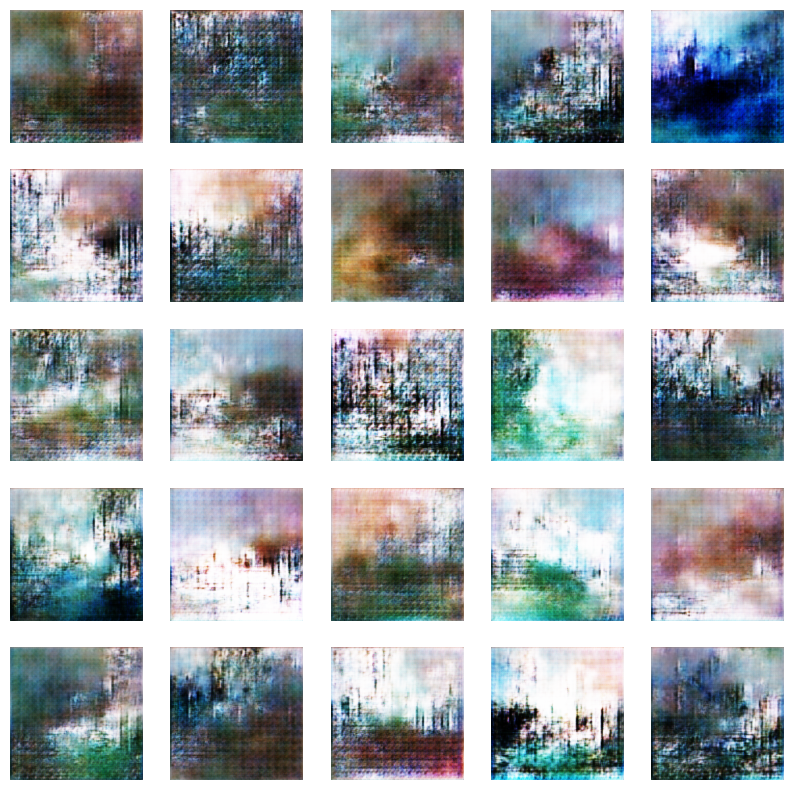

1/1 [==============================] - 0s 183ms/step
Time for epoch 40 is 13.694833278656006 sec, mean loss is 1.8451848030090332


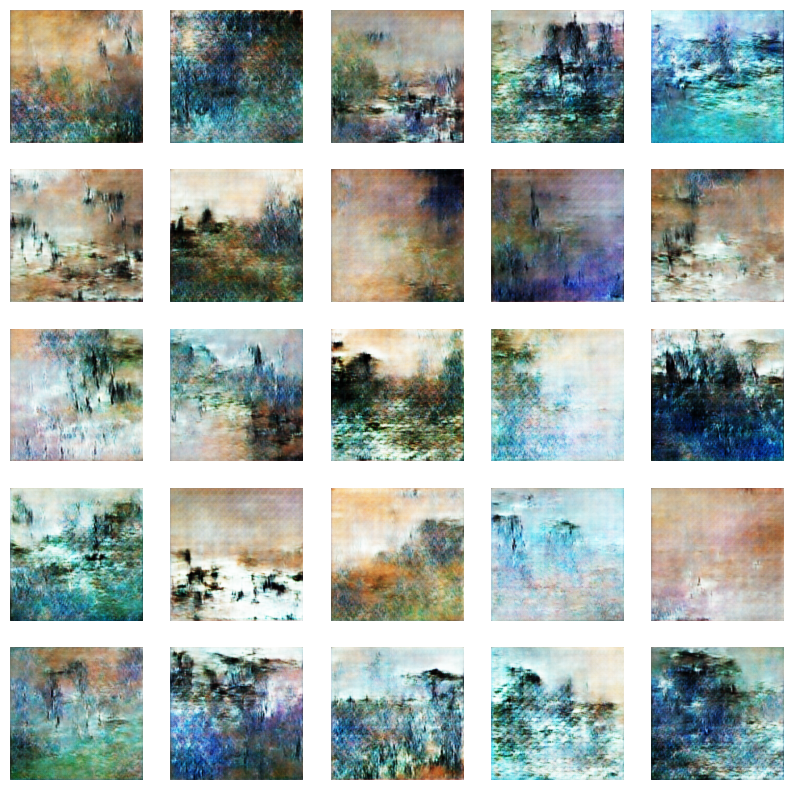

1/1 [==============================] - 0s 181ms/step


In [50]:
table_5, ep_ls_5, mean_ls_5 = gan5.train_loop()

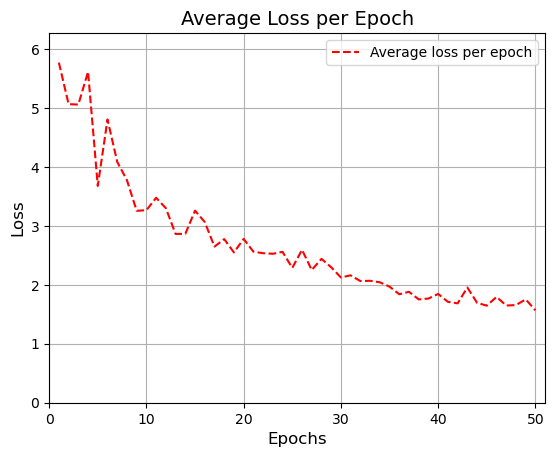

In [51]:
plot_loss_training(ep_ls_5, mean_ls_5, 'avg_loss_per_epoch_5')

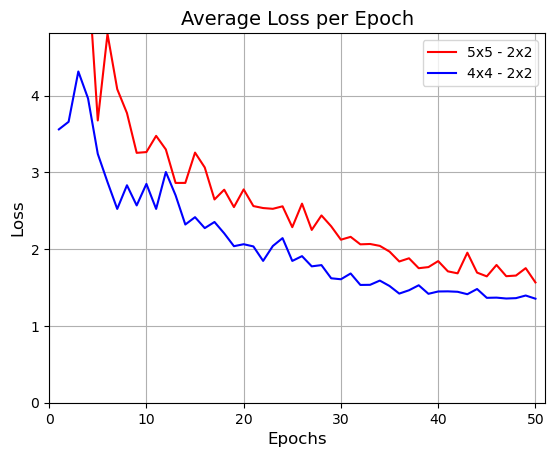

In [52]:
plt.plot(ep_ls_5, mean_ls_5, label='5x5 - 2x2',color='red')
plt.plot(ep_ls_4, mean_ls_4, label='4x4 - 2x2',color='blue')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Average Loss per Epoch', fontsize=14)
plt.grid()
plt.xlim(0, max(ep_ls_5)+1)
plt.ylim(0, max(mean_ls_4)+0.5)
plt.legend()
plt.show()

In [53]:
tf_gif('single_5', 'single_5.gif')
tf_gif('grid_5', "dcgan_5.gif")

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  


In [54]:
for folder in ['single', 'grid']:
    zip_images('/kaggle/working/' + folder + '_5', 'dcgan_' + folder + '_5.zip')

# Results

We have evaluated four different models, each having undergone hyperparameter tuning and adjustments in kernel size. I conducted 500 epochs for each model, and upon reviewing the images they generated, it became clear that the generator from the first model produced the highest quality paintings. Consequently, I will use this generator to create 7,000 images for submission.

**Note: In this current setup, I am limiting the models with 50 epoch. However, all models were initially tested with 500 epochs. Running 500 epochs for each model is time-consuming and we can't submit the applications.**

# Submission

In [55]:
mkdir ../images

In [56]:
start = time.time()
with strategy.scope():
    for i in range(8000):
        noise = tf.random.normal([BATCH_SIZE, noise_dim])
        img = generator.predict(noise)
        img = 0.5 * img + 0.5
        img = (img * 255).astype('uint8')
        img = Image.fromarray(img[0, :, :, :])
        img.save("../images/" + str(i) + ".jpg")
print('Total running time is {} sec'.format(time.time()-start))

1/1 [==============================] - 0s 19ms/step
Total running time is 1016.6872310638428 sec


In [57]:
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'

# Discussion and Conclusion

As observed, the first model outperformed all others. There is substantial room for improvement. By conducting further hyperparameter tuning, we can enhance its performance even more. Additionally, exploring alternative methods such as CycleGAN might yield even better results.

CycleGAN is a type of Generative Adversarial Network (GAN) that introduces a novel approach to image-to-image translation tasks. Developed by Jun-Yan Zhu, Taesung Park, Phillip Isola, and Alexei A. Efros in 2017, CycleGAN allows for the transformation of images from one domain to another without the need for paired examples. This model is particularly effective in scenarios where paired training data is not available, such as converting horses to zebras, summer to winter scenes, or paintings to photographs.

The key innovation of CycleGAN is its use of cycle consistency, meaning that it can learn to translate an image from domain A to domain B, and vice versa, in a way that an image translated from A to B can be translated back to A without loss of original content and structure. The model comprises two GANs, each consisting of a generator and a discriminator. The first GAN learns to map images from domain A to domain B, while the second learns the reverse mapping. This bidirectional training reinforced by a cycle consistency loss minimizes the reconstruction error, ensuring that the generated images in both transformations retain their original characteristics effectively.

CycleGAN has been widely used in various applications such as photo enhancement, style transfer, image synthesis, and even in tasks that go beyond imagery like unsupervised machine translation, demonstrating its versatility and effectiveness in handling complex unpaired data translation tasks. Its ability to generalize well from unaligned datasets presents significant advantages in practical scenarios where paired data is scarce or difficult to obtain.